# Оптимизация RMSProp

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf
import os
import gc
import numpy as np 
import pandas as pd
import time
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
from PIL import Image
SEED = 42

In [ ]:
data = np.load('/content/drive/MyDrive/Диплом/Ship_detection/Input/data_for_train.npy')
data_target = np.load('/content/drive/MyDrive/Диплом/Ship_detection/Input/target_for_train.npy')

In [ ]:
print("array sizes of data array: ", data.shape)
print("array sizes of target array: ",data_target.shape)
print("example of one image in data array\n", data[0])  
print("example of target for one image in array: ", data_target[0])


array sizes of data array:  (20000, 128, 128, 3)
array sizes of target array:  (20000,)
example of one image in data array
 [[[69 87 61]
  [71 88 61]
  [69 84 59]
  ...
  [69 87 63]
  [64 85 59]
  [66 88 64]]

 [[70 89 62]
  [70 86 60]
  [72 88 63]
  ...
  [70 88 63]
  [66 87 62]
  [65 88 65]]

 [[71 89 62]
  [71 88 61]
  [73 88 63]
  ...
  [70 86 61]
  [69 89 63]
  [67 88 64]]

 ...

 [[79 85 58]
  [84 89 61]
  [82 88 60]
  ...
  [67 85 61]
  [67 85 61]
  [68 86 62]]

 [[81 89 62]
  [79 87 61]
  [76 85 58]
  ...
  [68 86 62]
  [67 85 61]
  [68 86 62]]

 [[79 89 64]
  [76 86 61]
  [77 86 61]
  ...
  [66 84 62]
  [67 85 62]
  [67 85 62]]]
example of target for one image in array:  1


In [ ]:
#Set target to one hot target for classification problem
from sklearn.preprocessing import OneHotEncoder
targets = data_target.reshape(len(data_target),-1)
enc = OneHotEncoder()
enc.fit(targets)
targets = enc.transform(targets).toarray()
print(targets.shape)
del data_target
targets

(20000, 2)


array([[0., 1.],
       [0., 1.],
       [0., 1.],
       ...,
       [0., 1.],
       [1., 0.],
       [0., 1.]])

In [ ]:
#Split Training data to training data and validate data to detect overfit
from sklearn.model_selection import train_test_split
x_train, x_val, y_train, y_val = train_test_split(data,targets, test_size = 0.2, random_state = SEED)
x_train.shape, x_val.shape, y_train.shape, y_val.shape

((16000, 128, 128, 3), (4000, 128, 128, 3), (16000, 2), (4000, 2))

In [ ]:
#Data augumatation
from keras.preprocessing.image import ImageDataGenerator
img_gen = ImageDataGenerator()

In [ ]:
#Load ResNet50 model with Keras
#from keras.applications.vgg16 import VGG16 as PTModel, preprocess_input
#from keras.applications.densenet import DenseNet169 as PTModel, preprocess_input
#from keras.applications.resnet50 import ResNet50 as ResModel
#from keras.applications.vgg16 import VGG16 as VGG16Model
#img_width, img_height = 256, 256
#model = VGG16Model(weights = 'imagenet', include_top=False, input_shape = (img_width, img_height, 3))

In [ ]:
gc.collect()

152

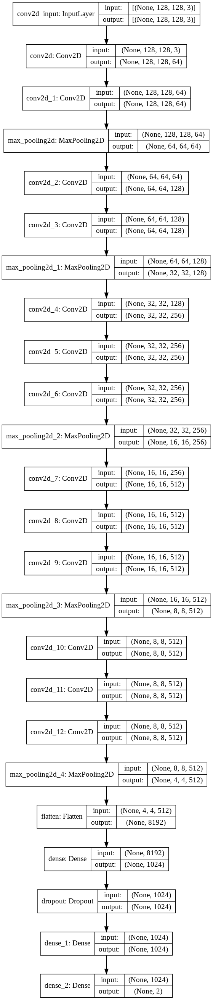

In [ ]:
#On this case, we only need predict 2 category (1. have ship, 2. no ship)
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization
from keras.callbacks import ModelCheckpoint


# creating the final model 
model = Sequential()

model.add(Conv2D(filters = 64, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (128, 128, 3))) #1
model.add(Conv2D(filters = 64, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (128, 128, 64))) #2
model.add(MaxPool2D(pool_size=(2, 2)))                                                                                  #3
model.add(Conv2D(filters = 128, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (128/2, 128/2, 64))) #4
model.add(Conv2D(filters = 128, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (128/2, 128/2, 128))) #5
model.add(MaxPool2D(pool_size=(2, 2)))                                                                                       #6
model.add(Conv2D(filters = 256, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (64/2, 64/2, 128))) #7
model.add(Conv2D(filters = 256, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (64/2, 64/2, 256))) #8
model.add(Conv2D(filters = 256, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (64/2, 64/2, 256))) #9
model.add(MaxPool2D(pool_size=(2, 2)))                                                                                   #10
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (32/2, 32/2, 256))) #11
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (32/2, 32/2, 512))) #12
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (32/2, 32/2, 512))) #13
model.add(MaxPool2D(pool_size=(2, 2)))                                                                                   #14
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (16/2, 16/2, 512))) #15
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (16/2, 16/2, 512))) #16
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (16/2, 16/2, 512))) #17
model.add(MaxPool2D(pool_size=(2, 2)))                                                                                    #18

model.add(Flatten())
model.add(Dense(1024, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(1024, activation = "relu"))
model.add(Dense(2, activation = "softmax"))

filepath="weights-improvement-{epoch:02d}-{val_accuracy:.2f}.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
callbacks_list = [checkpoint]

image_file = 'model_1.png'
tf.keras.utils.plot_model(model, to_file = image_file, show_shapes = True)

In [ ]:
#Set Hyperparameter and Start training
from keras import optimizers
from keras.optimizers import RMSprop
epochs = 50
lrate = 0.001 #learning rate
batch_size = 256
decay = lrate/epochs # Learning rate decay over each update
optimizer = RMSprop(lr = 0.001, rho = 0.9, epsilon = 1e-08, decay = decay)
#model.load_weights("transfer_ship_v1_5.h5")
model.compile(loss = 'categorical_crossentropy', optimizer = optimizer, metrics = ['accuracy', tf.keras.metrics.AUC(curve = 'ROC'), tf.keras.metrics.AUC(curve = 'PR')])
#model_final.summary()

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 128, 64)      1792      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 64)      36928     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 128)       73856     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 64, 64, 128)       147584    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 32, 128)       0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 32, 32, 256)       2

In [ ]:
gc.collect()

3676

In [ ]:
history = model.fit(img_gen.flow(x_train, y_train, batch_size = batch_size), epochs = epochs, validation_data = (x_val,y_val),
                          steps_per_epoch = int(len(x_train)/batch_size), callbacks=callbacks_list)
model.save('transfer_ship_exp.h5')

Epoch 1/50
62/62 [==============================] - 141s 1s/step - loss: 64866.9059 - accuracy: 0.5017 - auc: 0.5033 - auc_1: 0.5021 - val_loss: 0.6906 - val_accuracy: 0.5428 - val_auc: 0.5428 - val_auc_1: 0.5308

Epoch 00001: val_accuracy improved from -inf to 0.54275, saving model to weights-improvement-01-0.54.h5
Epoch 2/50
62/62 [==============================] - 71s 1s/step - loss: 0.6988 - accuracy: 0.5398 - auc: 0.5363 - auc_1: 0.5256 - val_loss: 0.6895 - val_accuracy: 0.5428 - val_auc: 0.5487 - val_auc_1: 0.5355

Epoch 00002: val_accuracy did not improve from 0.54275
Epoch 3/50
62/62 [==============================] - 70s 1s/step - loss: 0.6943 - accuracy: 0.5319 - auc: 0.5351 - auc_1: 0.5248 - val_loss: 0.6899 - val_accuracy: 0.5428 - val_auc: 0.5387 - val_auc_1: 0.5239

Epoch 00003: val_accuracy did not improve from 0.54275
Epoch 4/50
62/62 [==============================] - 70s 1s/step - loss: 1.6645 - accuracy: 0.5438 - auc: 0.5406 - auc_1: 0.5255 - val_loss: 0.6887 - val_a

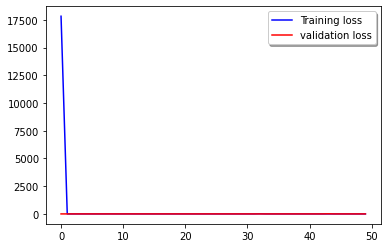

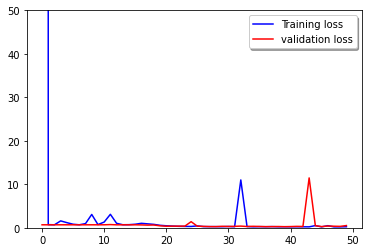

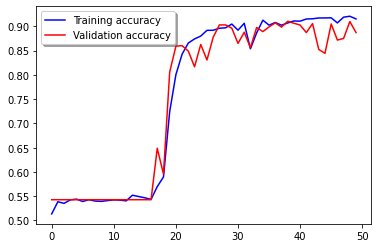

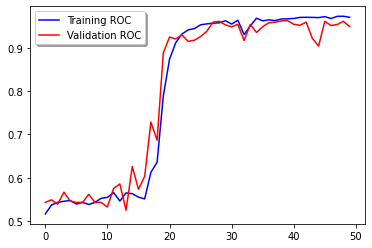

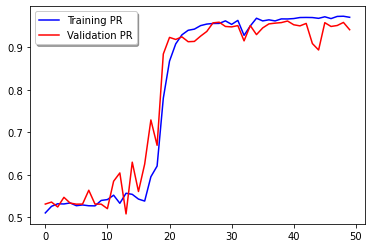

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], color='b', label="Training loss")
plt.plot(history.history['val_loss'], color='r', label="validation loss")
plt.legend(loc='best', shadow=True)
plt.show()

plt.plot(history.history['loss'], color='b', label="Training loss")
plt.plot(history.history['val_loss'], color='r', label="validation loss")
plt.legend(loc='best', shadow=True)
plt.ylim(0, 50)
plt.show()

plt.plot(history.history['accuracy'], color='b', label="Training accuracy")
plt.plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = plt.legend(loc='best', shadow=True)
plt.show()

plt.plot(history.history['auc'], color='b', label="Training ROC")
plt.plot(history.history['val_auc'], color='r',label="Validation ROC")
plt.legend(loc='best', shadow=True)
plt.show()

plt.plot(history.history['auc_1'], color='b', label="Training PR")
plt.plot(history.history['val_auc_1'], color='r',label="Validation PR")
plt.legend(loc='best', shadow=True)
plt.show()

In [ ]:
gc.collect()

11579

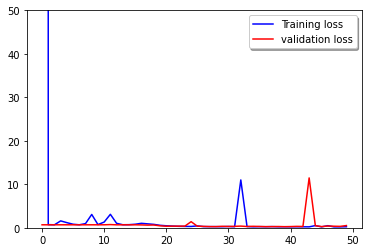

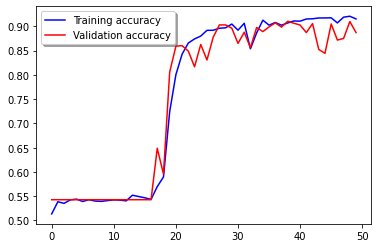

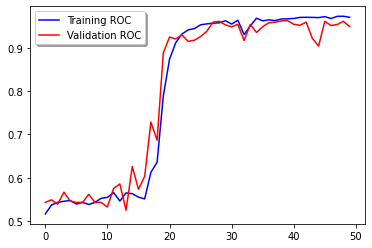

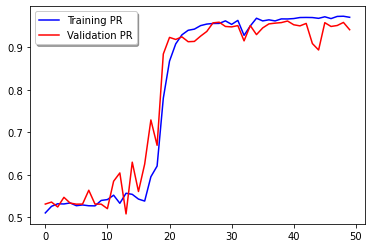

In [ ]:

plot_path = "/content/drive/MyDrive/Диплом/Ship_detection/CNN_PRACT/PLOTS/CURSE_RES/"
plt.plot(history.history['loss'], color='b', label="Training loss")
plt.plot(history.history['val_loss'], color='r', label="validation loss")
plt.legend(loc='best', shadow=True)
plt.ylim(0, 50)
plt.savefig(plot_path + "loss.png")
plt.show()

plt.plot(history.history['accuracy'], color='b', label="Training accuracy")
plt.plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = plt.legend(loc='best', shadow=True)
plt.savefig(plot_path + "acc.png")
plt.show()

plt.plot(history.history['auc'], color='b', label="Training ROC")
plt.plot(history.history['val_auc'], color='r',label="Validation ROC")
plt.legend(loc='best', shadow=True)
plt.savefig(plot_path + "roc.png")
plt.show()

plt.plot(history.history['auc_1'], color='b', label="Training PR")
plt.plot(history.history['val_auc_1'], color='r',label="Validation PR")
plt.legend(loc='best', shadow=True)
plt.savefig(plot_path + "pr.png")
plt.show()

# Гипотеза о применении оптимизатора ADAM

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

KeyboardInterrupt: ignored

In [ ]:
import tensorflow as tf
import os
import gc
import numpy as np 
import pandas as pd
import time
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
from PIL import Image
SEED = 42

In [ ]:
data = np.load('/content/drive/MyDrive/Диплом/Ship_detection/Input/data_for_train.npy')
data_target = np.load('/content/drive/MyDrive/Диплом/Ship_detection/Input/target_for_train.npy')

In [ ]:
print("array sizes of data array: ", data.shape)
print("array sizes of target array: ",data_target.shape)
print("example of one image in data array\n", data[0])  
print("example of target for one image in array: ", data_target[0])


array sizes of data array:  (20000, 128, 128, 3)
array sizes of target array:  (20000,)
example of one image in data array
 [[[69 87 61]
  [71 88 61]
  [69 84 59]
  ...
  [69 87 63]
  [64 85 59]
  [66 88 64]]

 [[70 89 62]
  [70 86 60]
  [72 88 63]
  ...
  [70 88 63]
  [66 87 62]
  [65 88 65]]

 [[71 89 62]
  [71 88 61]
  [73 88 63]
  ...
  [70 86 61]
  [69 89 63]
  [67 88 64]]

 ...

 [[79 85 58]
  [84 89 61]
  [82 88 60]
  ...
  [67 85 61]
  [67 85 61]
  [68 86 62]]

 [[81 89 62]
  [79 87 61]
  [76 85 58]
  ...
  [68 86 62]
  [67 85 61]
  [68 86 62]]

 [[79 89 64]
  [76 86 61]
  [77 86 61]
  ...
  [66 84 62]
  [67 85 62]
  [67 85 62]]]
example of target for one image in array:  1


In [ ]:
#Set target to one hot target for classification problem
from sklearn.preprocessing import OneHotEncoder
targets = data_target.reshape(len(data_target),-1)
enc = OneHotEncoder()
enc.fit(targets)
targets = enc.transform(targets).toarray()
print(targets.shape)
del data_target
targets

(20000, 2)


array([[0., 1.],
       [0., 1.],
       [0., 1.],
       ...,
       [0., 1.],
       [1., 0.],
       [0., 1.]])

In [ ]:
#Split Training data to training data and validate data to detect overfit
from sklearn.model_selection import train_test_split
x_train, x_val, y_train, y_val = train_test_split(data,targets, test_size = 0.2, random_state = SEED)
x_train.shape, x_val.shape, y_train.shape, y_val.shape

((16000, 128, 128, 3), (4000, 128, 128, 3), (16000, 2), (4000, 2))

In [ ]:
#Data augumatation
from keras.preprocessing.image import ImageDataGenerator
img_gen = ImageDataGenerator()

In [ ]:
#Load ResNet50 model with Keras
#from keras.applications.vgg16 import VGG16 as PTModel, preprocess_input
#from keras.applications.densenet import DenseNet169 as PTModel, preprocess_input
#from keras.applications.resnet50 import ResNet50 as ResModel
#from keras.applications.vgg16 import VGG16 as VGG16Model
#img_width, img_height = 256, 256
#model = VGG16Model(weights = 'imagenet', include_top=False, input_shape = (img_width, img_height, 3))

In [ ]:
gc.collect()

10929

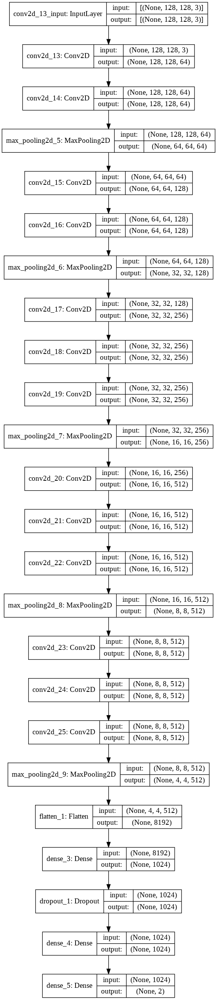

In [ ]:
#On this case, we only need predict 2 category (1. have ship, 2. no ship)
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization
from keras.callbacks import ModelCheckpoint


# creating the final model 
model = Sequential()

model.add(Conv2D(filters = 64, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (128, 128, 3))) #1
model.add(Conv2D(filters = 64, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (128, 128, 64))) #2
model.add(MaxPool2D(pool_size=(2, 2)))                                                                                  #3
model.add(Conv2D(filters = 128, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (128/2, 128/2, 64))) #4
model.add(Conv2D(filters = 128, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (128/2, 128/2, 128))) #5
model.add(MaxPool2D(pool_size=(2, 2)))                                                                                       #6
model.add(Conv2D(filters = 256, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (64/2, 64/2, 128))) #7
model.add(Conv2D(filters = 256, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (64/2, 64/2, 256))) #8
model.add(Conv2D(filters = 256, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (64/2, 64/2, 256))) #9
model.add(MaxPool2D(pool_size=(2, 2)))                                                                                   #10
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (32/2, 32/2, 256))) #11
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (32/2, 32/2, 512))) #12
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (32/2, 32/2, 512))) #13
model.add(MaxPool2D(pool_size=(2, 2)))                                                                                   #14
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (16/2, 16/2, 512))) #15
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (16/2, 16/2, 512))) #16
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (16/2, 16/2, 512))) #17
model.add(MaxPool2D(pool_size=(2, 2)))                                                                                    #18

model.add(Flatten())
model.add(Dense(1024, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(1024, activation = "relu"))
model.add(Dense(2, activation = "softmax"))

filepath="weights-improvement-{epoch:02d}-{val_accuracy:.2f}.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
callbacks_list = [checkpoint]

image_file = 'model_1.png'
tf.keras.utils.plot_model(model, to_file = image_file, show_shapes = True)

In [ ]:
#Set Hyperparameter and Start training
from keras import optimizers
from keras.optimizers import RMSprop, Adam
epochs = 50
lrate = 0.001 #learning rate
batch_size = 256
decay = lrate/epochs # Learning rate decay over each update
#optimizer = RMSprop(lr = 0.001, rho = 0.9, epsilon = 1e-08, decay = decay)
optimizer = Adam(learning_rate = 0.001, epsilon = 1e-08, decay = decay)
#model.load_weights("transfer_ship_v1_5.h5")
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy', tf.keras.metrics.AUC(curve = 'ROC'), tf.keras.metrics.AUC(curve = 'PR')])
#model_final.summary()

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_13 (Conv2D)           (None, 128, 128, 64)      1792      
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 128, 128, 64)      36928     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 64, 64, 128)       73856     
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 64, 64, 128)       147584    
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 32, 32, 128)       0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 32, 32, 256)      

In [ ]:
gc.collect()

6771

In [ ]:
history = model.fit(img_gen.flow(x_train, y_train, batch_size = batch_size), epochs = epochs, validation_data = (x_val,y_val),
                          steps_per_epoch = int(len(x_train)/batch_size), callbacks=callbacks_list)
model.save('transfer_ship_exp.h5')

Epoch 1/50
62/62 [==============================] - 139s 2s/step - loss: 8.9462 - accuracy: 0.5278 - auc_2: 0.5237 - auc_3: 0.5185 - val_loss: 0.6915 - val_accuracy: 0.5428 - val_auc_2: 0.5428 - val_auc_3: 0.5308

Epoch 00001: val_accuracy improved from -inf to 0.54275, saving model to weights-improvement-01-0.54.h5
Epoch 2/50
62/62 [==============================] - 135s 2s/step - loss: 0.6916 - accuracy: 0.5370 - auc_2: 0.5412 - auc_3: 0.5273 - val_loss: 0.6885 - val_accuracy: 0.5428 - val_auc_2: 0.5700 - val_auc_3: 0.5730

Epoch 00002: val_accuracy did not improve from 0.54275
Epoch 3/50
62/62 [==============================] - 135s 2s/step - loss: 0.6868 - accuracy: 0.5434 - auc_2: 0.5608 - auc_3: 0.5560 - val_loss: 0.6903 - val_accuracy: 0.5430 - val_auc_2: 0.5513 - val_auc_3: 0.5493

Epoch 00003: val_accuracy improved from 0.54275 to 0.54300, saving model to weights-improvement-03-0.54.h5
Epoch 4/50
62/62 [==============================] - 135s 2s/step - loss: 0.6969 - accuracy: 

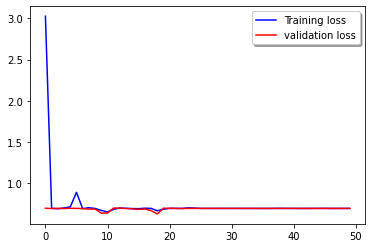

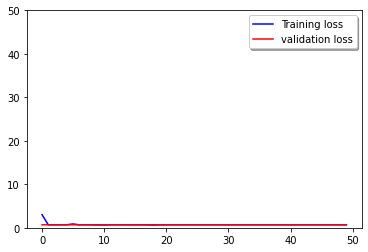

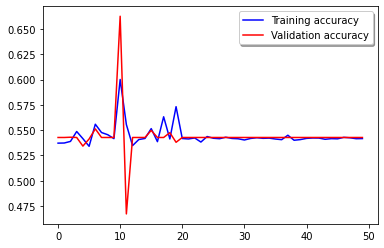

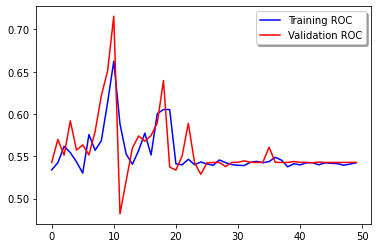

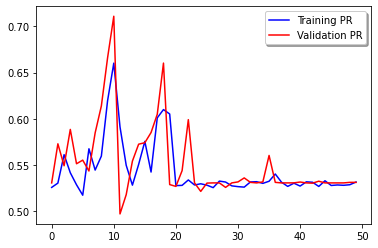

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], color='b', label="Training loss")
plt.plot(history.history['val_loss'], color='r', label="validation loss")
plt.legend(loc='best', shadow=True)
plt.show()

plt.plot(history.history['loss'], color='b', label="Training loss")
plt.plot(history.history['val_loss'], color='r', label="validation loss")
plt.legend(loc='best', shadow=True)
plt.ylim(0, 50)
plt.show()

plt.plot(history.history['accuracy'], color='b', label="Training accuracy")
plt.plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = plt.legend(loc='best', shadow=True)
plt.show()

plt.plot(history.history['auc_2'], color='b', label="Training ROC")
plt.plot(history.history['val_auc_2'], color='r',label="Validation ROC")
plt.legend(loc='best', shadow=True)
plt.show()

plt.plot(history.history['auc_3'], color='b', label="Training PR")
plt.plot(history.history['val_auc_3'], color='r',label="Validation PR")
plt.legend(loc='best', shadow=True)
plt.show()

In [ ]:
gc.collect()

In [ ]:

plot_path = "/content/drive/MyDrive/Диплом/Ship_detection/CNN_PRACT/PLOTS/ADAM_res/"
plt.plot(history.history['loss'], color='b', label="Training loss")
plt.plot(history.history['val_loss'], color='r', label="validation loss")
plt.legend(loc='best', shadow=True)
plt.ylim(0, 50)
plt.savefig(plot_path + "loss.png")
plt.show()

plt.plot(history.history['accuracy'], color='b', label="Training accuracy")
plt.plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = plt.legend(loc='best', shadow=True)
plt.savefig(plot_path + "acc.png")
plt.show()

plt.plot(history.history['auc_2'], color='b', label="Training ROC")
plt.plot(history.history['val_auc_2'], color='r',label="Validation ROC")
plt.legend(loc='best', shadow=True)
plt.savefig(plot_path + "roc.png")
plt.show()

plt.plot(history.history['auc_1'], color='b', label="Training PR")
plt.plot(history.history['val_auc_1'], color='r',label="Validation PR")
plt.legend(loc='best', shadow=True)
plt.savefig(plot_path + "pr.png")
plt.show()

# ADAM с иной функцией потерь

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf
import os
import gc
import numpy as np 
import pandas as pd
import time
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
from PIL import Image
SEED = 42

In [ ]:
data = np.load('/content/drive/MyDrive/Диплом/Ship_detection/Input/data_for_train.npy')
data_target = np.load('/content/drive/MyDrive/Диплом/Ship_detection/Input/target_for_train.npy')

In [ ]:
print("array sizes of data array: ", data.shape)
print("array sizes of target array: ",data_target.shape)
print("example of one image in data array\n", data[0])  
print("example of target for one image in array: ", data_target[0])


array sizes of data array:  (20000, 128, 128, 3)
array sizes of target array:  (20000,)
example of one image in data array
 [[[69 87 61]
  [71 88 61]
  [69 84 59]
  ...
  [69 87 63]
  [64 85 59]
  [66 88 64]]

 [[70 89 62]
  [70 86 60]
  [72 88 63]
  ...
  [70 88 63]
  [66 87 62]
  [65 88 65]]

 [[71 89 62]
  [71 88 61]
  [73 88 63]
  ...
  [70 86 61]
  [69 89 63]
  [67 88 64]]

 ...

 [[79 85 58]
  [84 89 61]
  [82 88 60]
  ...
  [67 85 61]
  [67 85 61]
  [68 86 62]]

 [[81 89 62]
  [79 87 61]
  [76 85 58]
  ...
  [68 86 62]
  [67 85 61]
  [68 86 62]]

 [[79 89 64]
  [76 86 61]
  [77 86 61]
  ...
  [66 84 62]
  [67 85 62]
  [67 85 62]]]
example of target for one image in array:  1


In [ ]:
#Set target to one hot target for classification problem
from sklearn.preprocessing import OneHotEncoder
targets = data_target.reshape(len(data_target),-1)
enc = OneHotEncoder()
enc.fit(targets)
targets = enc.transform(targets).toarray()
print(targets.shape)
del data_target
targets

(20000, 2)


array([[0., 1.],
       [0., 1.],
       [0., 1.],
       ...,
       [0., 1.],
       [1., 0.],
       [0., 1.]])

In [ ]:
#Split Training data to training data and validate data to detect overfit
from sklearn.model_selection import train_test_split
x_train, x_val, y_train, y_val = train_test_split(data,targets, test_size = 0.2, random_state = SEED)
x_train.shape, x_val.shape, y_train.shape, y_val.shape

((16000, 128, 128, 3), (4000, 128, 128, 3), (16000, 2), (4000, 2))

In [ ]:
#Data augumatation
from keras.preprocessing.image import ImageDataGenerator
img_gen = ImageDataGenerator()

In [ ]:
#Load ResNet50 model with Keras
#from keras.applications.vgg16 import VGG16 as PTModel, preprocess_input
#from keras.applications.densenet import DenseNet169 as PTModel, preprocess_input
#from keras.applications.resnet50 import ResNet50 as ResModel
#from keras.applications.vgg16 import VGG16 as VGG16Model
#img_width, img_height = 256, 256
#model = VGG16Model(weights = 'imagenet', include_top=False, input_shape = (img_width, img_height, 3))

In [ ]:
gc.collect()

100

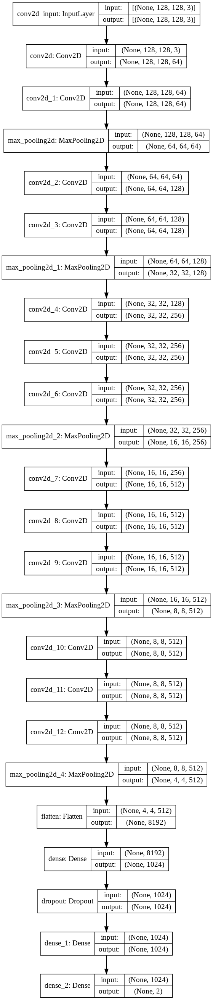

In [ ]:
#On this case, we only need predict 2 category (1. have ship, 2. no ship)
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization
from keras.callbacks import ModelCheckpoint


# creating the final model 
model = Sequential()

model.add(Conv2D(filters = 64, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (128, 128, 3))) #1
model.add(Conv2D(filters = 64, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (128, 128, 64))) #2
model.add(MaxPool2D(pool_size=(2, 2)))                                                                                  #3
model.add(Conv2D(filters = 128, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (128/2, 128/2, 64))) #4
model.add(Conv2D(filters = 128, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (128/2, 128/2, 128))) #5
model.add(MaxPool2D(pool_size=(2, 2)))                                                                                       #6
model.add(Conv2D(filters = 256, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (64/2, 64/2, 128))) #7
model.add(Conv2D(filters = 256, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (64/2, 64/2, 256))) #8
model.add(Conv2D(filters = 256, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (64/2, 64/2, 256))) #9
model.add(MaxPool2D(pool_size=(2, 2)))                                                                                   #10
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (32/2, 32/2, 256))) #11
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (32/2, 32/2, 512))) #12
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (32/2, 32/2, 512))) #13
model.add(MaxPool2D(pool_size=(2, 2)))                                                                                   #14
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (16/2, 16/2, 512))) #15
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (16/2, 16/2, 512))) #16
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (16/2, 16/2, 512))) #17
model.add(MaxPool2D(pool_size=(2, 2)))                                                                                    #18

model.add(Flatten())
model.add(Dense(1024, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(1024, activation = "relu"))
model.add(Dense(2, activation = "softmax"))

filepath="weights-improvement-{epoch:02d}-{val_accuracy:.2f}.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
callbacks_list = [checkpoint]

image_file = 'model_1.png'
tf.keras.utils.plot_model(model, to_file = image_file, show_shapes = True)

In [ ]:
#Set Hyperparameter and Start training
from keras import optimizers
from keras.optimizers import RMSprop, Adam
epochs = 50
lrate = 0.001 #learning rate
batch_size = 256
decay = lrate/epochs # Learning rate decay over each update
#optimizer = RMSprop(lr = 0.001, rho = 0.9, epsilon = 1e-08, decay = decay)
optimizer = Adam(learning_rate = 0.001, epsilon = 1e-08, decay = decay)
#model.load_weights("transfer_ship_v1_5.h5")
model.compile(loss = "binary_crossentropy", optimizer = 'adam', metrics = ['accuracy', tf.keras.metrics.AUC(curve = 'ROC'), tf.keras.metrics.AUC(curve = 'PR')])
#model_final.summary()

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 128, 64)      1792      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 64)      36928     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 128)       73856     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 64, 64, 128)       147584    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 32, 128)       0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 32, 32, 256)       2

In [ ]:
gc.collect()

3423

In [ ]:
history = model.fit(img_gen.flow(x_train, y_train, batch_size = batch_size), epochs = epochs, validation_data = (x_val,y_val),
                          steps_per_epoch = int(len(x_train)/batch_size), callbacks=callbacks_list)
model.save('transfer_ship_exp.h5')

Epoch 1/50
62/62 [==============================] - 138s 1s/step - loss: 10.1188 - accuracy: 0.5140 - auc: 0.5148 - auc_1: 0.5092 - val_loss: 0.6902 - val_accuracy: 0.5428 - val_auc: 0.5481 - val_auc_1: 0.5351

Epoch 00001: val_accuracy improved from -inf to 0.54275, saving model to weights-improvement-01-0.54.h5
Epoch 2/50
62/62 [==============================] - 68s 1s/step - loss: 0.6920 - accuracy: 0.5400 - auc: 0.5383 - auc_1: 0.5259 - val_loss: 0.6895 - val_accuracy: 0.5428 - val_auc: 0.5428 - val_auc_1: 0.5308

Epoch 00002: val_accuracy did not improve from 0.54275
Epoch 3/50
62/62 [==============================] - 66s 1s/step - loss: 0.6906 - accuracy: 0.5371 - auc: 0.5342 - auc_1: 0.5247 - val_loss: 0.6895 - val_accuracy: 0.5428 - val_auc: 0.5428 - val_auc_1: 0.5308

Epoch 00003: val_accuracy did not improve from 0.54275
Epoch 4/50
62/62 [==============================] - 65s 1s/step - loss: 0.6902 - accuracy: 0.5397 - auc: 0.5341 - auc_1: 0.5223 - val_loss: 0.6895 - val_accu

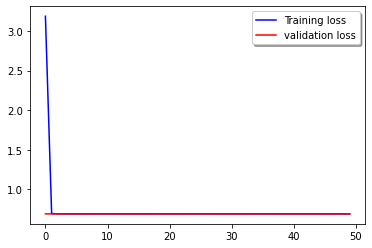

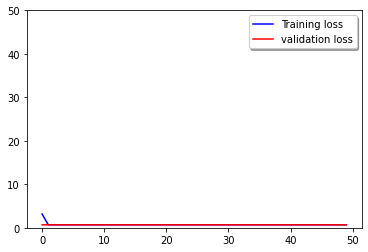

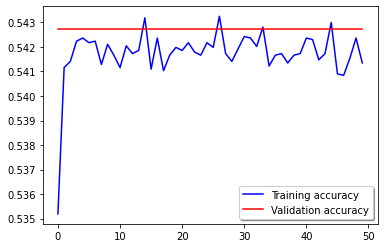

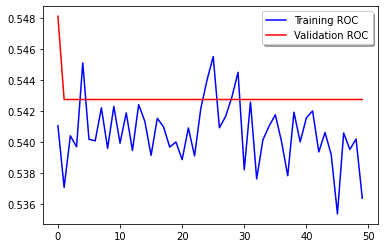

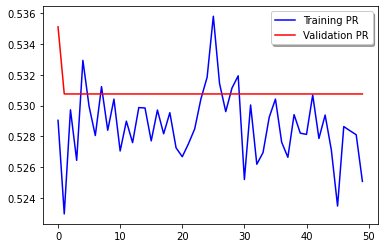

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], color='b', label="Training loss")
plt.plot(history.history['val_loss'], color='r', label="validation loss")
plt.legend(loc='best', shadow=True)
plt.show()

plt.plot(history.history['loss'], color='b', label="Training loss")
plt.plot(history.history['val_loss'], color='r', label="validation loss")
plt.legend(loc='best', shadow=True)
plt.ylim(0, 50)
plt.show()

plt.plot(history.history['accuracy'], color='b', label="Training accuracy")
plt.plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = plt.legend(loc='best', shadow=True)
plt.show()

plt.plot(history.history['auc'], color='b', label="Training ROC")
plt.plot(history.history['val_auc'], color='r',label="Validation ROC")
plt.legend(loc='best', shadow=True)
plt.show()

plt.plot(history.history['auc_1'], color='b', label="Training PR")
plt.plot(history.history['val_auc_1'], color='r',label="Validation PR")
plt.legend(loc='best', shadow=True)
plt.show()

In [ ]:
gc.collect()

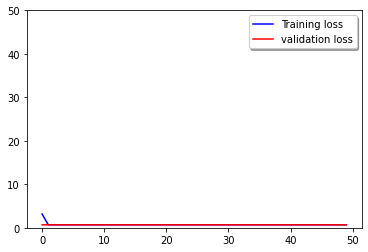

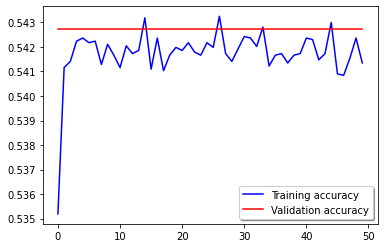

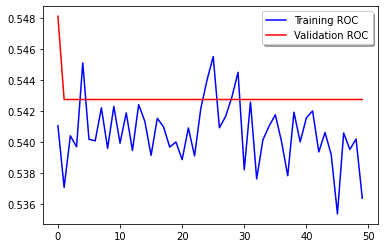

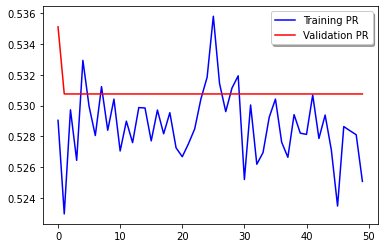

In [ ]:

plot_path = "/content/drive/MyDrive/Диплом/Ship_detection/CNN_PRACT/PLOTS/ADAM_res2/"
plt.plot(history.history['loss'], color='b', label="Training loss")
plt.plot(history.history['val_loss'], color='r', label="validation loss")
plt.legend(loc='best', shadow=True)
plt.ylim(0, 50)
plt.savefig(plot_path + "loss.png")
plt.show()

plt.plot(history.history['accuracy'], color='b', label="Training accuracy")
plt.plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = plt.legend(loc='best', shadow=True)
plt.savefig(plot_path + "acc.png")
plt.show()

plt.plot(history.history['auc'], color='b', label="Training ROC")
plt.plot(history.history['val_auc'], color='r',label="Validation ROC")
plt.legend(loc='best', shadow=True)
plt.savefig(plot_path + "roc.png")
plt.show()

plt.plot(history.history['auc_1'], color='b', label="Training PR")
plt.plot(history.history['val_auc_1'], color='r',label="Validation PR")
plt.legend(loc='best', shadow=True)
plt.savefig(plot_path + "pr.png")
plt.show()

# RMSProp с иной функцией потерь

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf
import os
import gc
import numpy as np 
import pandas as pd
import time
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
from PIL import Image
SEED = 42

In [ ]:
data = np.load('/content/drive/MyDrive/Диплом/Ship_detection/Input/data_for_train.npy')
data_target = np.load('/content/drive/MyDrive/Диплом/Ship_detection/Input/target_for_train.npy')

In [ ]:
print("array sizes of data array: ", data.shape)
print("array sizes of target array: ",data_target.shape)
print("example of one image in data array\n", data[0])  
print("example of target for one image in array: ", data_target[0])


array sizes of data array:  (20000, 128, 128, 3)
array sizes of target array:  (20000,)
example of one image in data array
 [[[69 87 61]
  [71 88 61]
  [69 84 59]
  ...
  [69 87 63]
  [64 85 59]
  [66 88 64]]

 [[70 89 62]
  [70 86 60]
  [72 88 63]
  ...
  [70 88 63]
  [66 87 62]
  [65 88 65]]

 [[71 89 62]
  [71 88 61]
  [73 88 63]
  ...
  [70 86 61]
  [69 89 63]
  [67 88 64]]

 ...

 [[79 85 58]
  [84 89 61]
  [82 88 60]
  ...
  [67 85 61]
  [67 85 61]
  [68 86 62]]

 [[81 89 62]
  [79 87 61]
  [76 85 58]
  ...
  [68 86 62]
  [67 85 61]
  [68 86 62]]

 [[79 89 64]
  [76 86 61]
  [77 86 61]
  ...
  [66 84 62]
  [67 85 62]
  [67 85 62]]]
example of target for one image in array:  1


In [ ]:
#Set target to one hot target for classification problem
from sklearn.preprocessing import OneHotEncoder
targets = data_target.reshape(len(data_target),-1)
enc = OneHotEncoder()
enc.fit(targets)
targets = enc.transform(targets).toarray()
print(targets.shape)
del data_target
targets

(20000, 2)


array([[0., 1.],
       [0., 1.],
       [0., 1.],
       ...,
       [0., 1.],
       [1., 0.],
       [0., 1.]])

In [ ]:
#Split Training data to training data and validate data to detect overfit
from sklearn.model_selection import train_test_split
x_train, x_val, y_train, y_val = train_test_split(data,targets, test_size = 0.2, random_state = SEED)
x_train.shape, x_val.shape, y_train.shape, y_val.shape

((16000, 128, 128, 3), (4000, 128, 128, 3), (16000, 2), (4000, 2))

In [ ]:
#Data augumatation
from keras.preprocessing.image import ImageDataGenerator
img_gen = ImageDataGenerator()

In [ ]:
#Load ResNet50 model with Keras
#from keras.applications.vgg16 import VGG16 as PTModel, preprocess_input
#from keras.applications.densenet import DenseNet169 as PTModel, preprocess_input
#from keras.applications.resnet50 import ResNet50 as ResModel
#from keras.applications.vgg16 import VGG16 as VGG16Model
#img_width, img_height = 256, 256
#model = VGG16Model(weights = 'imagenet', include_top=False, input_shape = (img_width, img_height, 3))

In [ ]:
gc.collect()

44

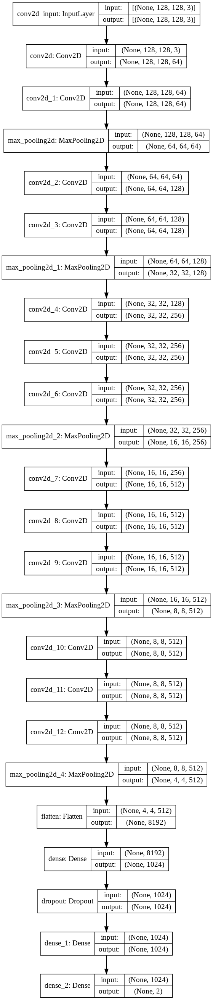

In [ ]:
#On this case, we only need predict 2 category (1. have ship, 2. no ship)
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization
from keras.callbacks import ModelCheckpoint


# creating the final model 
model = Sequential()

model.add(Conv2D(filters = 64, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (128, 128, 3))) #1
model.add(Conv2D(filters = 64, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (128, 128, 64))) #2
model.add(MaxPool2D(pool_size=(2, 2)))                                                                                  #3
model.add(Conv2D(filters = 128, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (128/2, 128/2, 64))) #4
model.add(Conv2D(filters = 128, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (128/2, 128/2, 128))) #5
model.add(MaxPool2D(pool_size=(2, 2)))                                                                                       #6
model.add(Conv2D(filters = 256, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (64/2, 64/2, 128))) #7
model.add(Conv2D(filters = 256, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (64/2, 64/2, 256))) #8
model.add(Conv2D(filters = 256, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (64/2, 64/2, 256))) #9
model.add(MaxPool2D(pool_size=(2, 2)))                                                                                   #10
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (32/2, 32/2, 256))) #11
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (32/2, 32/2, 512))) #12
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (32/2, 32/2, 512))) #13
model.add(MaxPool2D(pool_size=(2, 2)))                                                                                   #14
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (16/2, 16/2, 512))) #15
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (16/2, 16/2, 512))) #16
model.add(Conv2D(filters = 512, kernel_size = (3, 3), padding = 'Same', activation ='relu', input_shape = (16/2, 16/2, 512))) #17
model.add(MaxPool2D(pool_size=(2, 2)))                                                                                    #18

model.add(Flatten())
model.add(Dense(1024, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(1024, activation = "relu"))
model.add(Dense(2, activation = "softmax"))

filepath="weights-improvement-{epoch:02d}-{val_accuracy:.2f}.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
callbacks_list = [checkpoint]

image_file = 'model_1.png'
tf.keras.utils.plot_model(model, to_file = image_file, show_shapes = True)

In [ ]:
#Set Hyperparameter and Start training
from keras import optimizers
from keras.optimizers import RMSprop, Adam
epochs = 50
lrate = 0.001 #learning rate
batch_size = 256
decay = lrate/epochs # Learning rate decay over each update
optimizer = RMSprop(lr = 0.001, rho = 0.9, epsilon = 1e-08, decay = decay)
#optimizer = Adam(learning_rate = 0.001, epsilon = 1e-08, decay = decay)
#model.load_weights("transfer_ship_v1_5.h5")
model.compile(loss = "binary_crossentropy", optimizer = optimizer, metrics = ['accuracy', tf.keras.metrics.AUC(curve = 'ROC'), tf.keras.metrics.AUC(curve = 'PR')])
#model_final.summary()

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 128, 64)      1792      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 64)      36928     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 128)       73856     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 64, 64, 128)       147584    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 32, 128)       0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 32, 32, 256)       2

In [ ]:
gc.collect()

3511

In [ ]:
history = model.fit(img_gen.flow(x_train, y_train, batch_size = batch_size), epochs = epochs, validation_data = (x_val,y_val),
                          steps_per_epoch = int(len(x_train)/batch_size), callbacks=callbacks_list)
model.save('transfer_ship_exp.h5')

Epoch 1/50
62/62 [==============================] - 132s 1s/step - loss: 60189.3601 - accuracy: 0.5087 - auc: 0.4999 - auc_1: 0.4978 - val_loss: 0.6898 - val_accuracy: 0.5428 - val_auc: 0.5414 - val_auc_1: 0.5316

Epoch 00001: val_accuracy improved from -inf to 0.54275, saving model to weights-improvement-01-0.54.h5
Epoch 2/50
62/62 [==============================] - 69s 1s/step - loss: 0.6978 - accuracy: 0.5441 - auc: 0.5425 - auc_1: 0.5276 - val_loss: 0.6896 - val_accuracy: 0.5428 - val_auc: 0.5428 - val_auc_1: 0.5308

Epoch 00002: val_accuracy did not improve from 0.54275
Epoch 3/50
62/62 [==============================] - 69s 1s/step - loss: 0.9232 - accuracy: 0.5434 - auc: 0.5383 - auc_1: 0.5236 - val_loss: 0.6898 - val_accuracy: 0.5428 - val_auc: 0.5428 - val_auc_1: 0.5308

Epoch 00003: val_accuracy did not improve from 0.54275
Epoch 4/50
62/62 [==============================] - 69s 1s/step - loss: 0.6999 - accuracy: 0.5420 - auc: 0.5425 - auc_1: 0.5292 - val_loss: 0.6896 - val_a

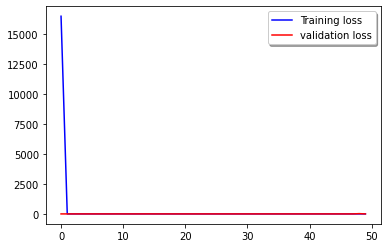

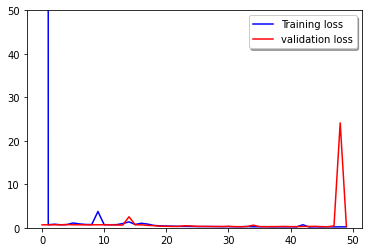

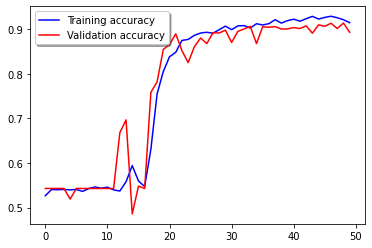

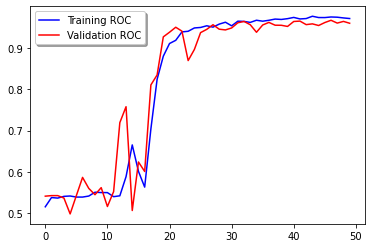

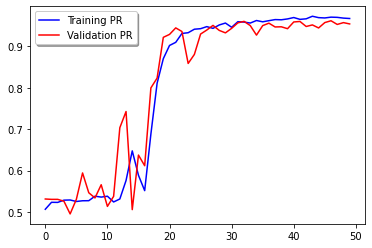

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], color='b', label="Training loss")
plt.plot(history.history['val_loss'], color='r', label="validation loss")
plt.legend(loc='best', shadow=True)
plt.show()

plt.plot(history.history['loss'], color='b', label="Training loss")
plt.plot(history.history['val_loss'], color='r', label="validation loss")
plt.legend(loc='best', shadow=True)
plt.ylim(0, 50)
plt.show()

plt.plot(history.history['accuracy'], color='b', label="Training accuracy")
plt.plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = plt.legend(loc='best', shadow=True)
plt.show()

plt.plot(history.history['auc'], color='b', label="Training ROC")
plt.plot(history.history['val_auc'], color='r',label="Validation ROC")
plt.legend(loc='best', shadow=True)
plt.show()

plt.plot(history.history['auc_1'], color='b', label="Training PR")
plt.plot(history.history['val_auc_1'], color='r',label="Validation PR")
plt.legend(loc='best', shadow=True)
plt.show()

In [ ]:
gc.collect()

11540

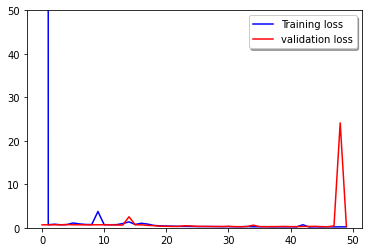

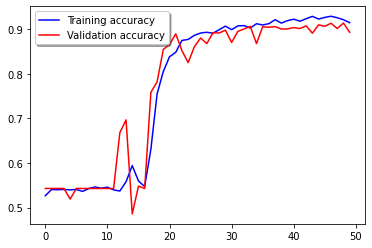

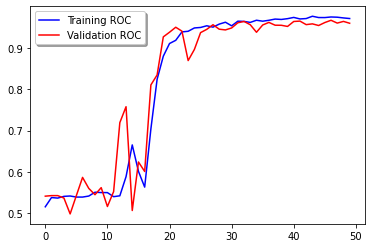

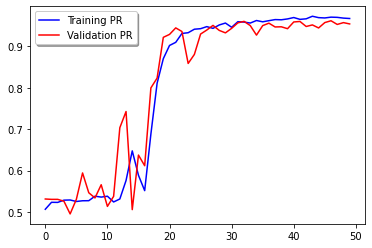

In [ ]:

plot_path = "/content/drive/MyDrive/Диплом/Ship_detection/CNN_PRACT/PLOTS/RMS_bin/"
plt.plot(history.history['loss'], color='b', label="Training loss")
plt.plot(history.history['val_loss'], color='r', label="validation loss")
plt.legend(loc='best', shadow=True)
plt.ylim(0, 50)
plt.savefig(plot_path + "loss.png")
plt.show()

plt.plot(history.history['accuracy'], color='b', label="Training accuracy")
plt.plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = plt.legend(loc='best', shadow=True)
plt.savefig(plot_path + "acc.png")
plt.show()

plt.plot(history.history['auc'], color='b', label="Training ROC")
plt.plot(history.history['val_auc'], color='r',label="Validation ROC")
plt.legend(loc='best', shadow=True)
plt.savefig(plot_path + "roc.png")
plt.show()

plt.plot(history.history['auc_1'], color='b', label="Training PR")
plt.plot(history.history['val_auc_1'], color='r',label="Validation PR")
plt.legend(loc='best', shadow=True)
plt.savefig(plot_path + "pr.png")
plt.show()

# Базовое решение - подбрасывание монеты

In [ ]:
import tensorflow as tf
import os
import gc
import numpy as np 
import pandas as pd
import time
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
from PIL import Image
import random
SEED = 42

In [ ]:
data = np.load('/content/drive/MyDrive/Диплом/Ship_detection/Input/data_for_train.npy')
data_target = np.load('/content/drive/MyDrive/Диплом/Ship_detection/Input/target_for_train.npy')

In [ ]:
print("array sizes of data array: ", data.shape)
print("array sizes of target array: ",data_target.shape)
print("example of one image in data array\n", data[0])  
print("example of target for one image in array: ", data_target[0])


array sizes of data array:  (20000, 128, 128, 3)
array sizes of target array:  (20000,)
example of one image in data array
 [[[69 87 61]
  [71 88 61]
  [69 84 59]
  ...
  [69 87 63]
  [64 85 59]
  [66 88 64]]

 [[70 89 62]
  [70 86 60]
  [72 88 63]
  ...
  [70 88 63]
  [66 87 62]
  [65 88 65]]

 [[71 89 62]
  [71 88 61]
  [73 88 63]
  ...
  [70 86 61]
  [69 89 63]
  [67 88 64]]

 ...

 [[79 85 58]
  [84 89 61]
  [82 88 60]
  ...
  [67 85 61]
  [67 85 61]
  [68 86 62]]

 [[81 89 62]
  [79 87 61]
  [76 85 58]
  ...
  [68 86 62]
  [67 85 61]
  [68 86 62]]

 [[79 89 64]
  [76 86 61]
  [77 86 61]
  ...
  [66 84 62]
  [67 85 62]
  [67 85 62]]]
example of target for one image in array:  1


In [ ]:
#Set target to one hot target for classification problem
from sklearn.preprocessing import OneHotEncoder
targets = data_target.reshape(len(data_target),-1)
enc = OneHotEncoder()
enc.fit(targets)
targets = enc.transform(targets).toarray()
print(targets.shape)
del data_target
targets

(20000, 2)


array([[0., 1.],
       [0., 1.],
       [0., 1.],
       ...,
       [0., 1.],
       [1., 0.],
       [0., 1.]])

In [ ]:
n = len(targets)
n

20000

In [ ]:
Y = np.array([[0] * 2] * n)
for i in range(n):
    rnd = random.random()
    Y[i] = [round(1 - rnd), round(rnd)]
Y

array([[0, 1],
       [1, 0],
       [0, 1],
       ...,
       [0, 1],
       [0, 1],
       [0, 1]])

In [ ]:
from sklearn.metrics import accuracy_score
print("Точность (accuracy) равно ", accuracy_score(targets, Y))

Точность (accuracy) равно  0.499


In [ ]:
from sklearn.metrics import precision_score
print("Точность (precision) равно ", 
      precision_score(targets.reshape(-1, 1), Y.reshape(-1, 1)))

Точность (precision) равно  0.499


In [ ]:
from sklearn.metrics import recall_score
print("Полнота (recall) равно ",
      recall_score(targets.reshape(-1, 1), Y.reshape(-1, 1)))

Полнота (recall) равно  0.499


In [ ]:
from sklearn.metrics import precision_recall_curve
from sklearn import metrics
pr, rc, tr = precision_recall_curve(targets.reshape(-1, 1), np.array([1/2, 1/2] * n).reshape(-1, 1))
metrics.auc(pr, rc)

0.25

# Решение задачи человеком

In [ ]:
import tensorflow as tf
import os
import gc
import numpy as np 
import pandas as pd
import time
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
from PIL import Image
import random
SEED = 42

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Диплом/Ship_detection/Input/ImgForTest.csv', index_col= 0)
data_target = np.load('/content/drive/MyDrive/Диплом/Ship_detection/Input/target_for_train.npy')
#Set target to one hot target for classification problem
from sklearn.preprocessing import OneHotEncoder
targets = data_target.reshape(len(data_target),-1)
enc = OneHotEncoder()
enc.fit(targets)
targets = enc.transform(targets).toarray()
print(targets.shape)
del data_target
targets

(20000, 2)


array([[0., 1.],
       [0., 1.],
       [0., 1.],
       ...,
       [0., 1.],
       [1., 0.],
       [0., 1.]])

In [ ]:
data

,ImageId,exist_ship,EncodedPixels
1,8ce7d933f.jpg,1,375 19 1143 19 1911 19 2679 19 3447 19 4215 19...
2,c69ee4d1e.jpg,1,232321 1 233088 3 233856 5 234623 7 235390 9 2...
3,2d8516460.jpg,1,389854 1 390621 4 391389 5 392156 5 392923 6 3...
7,f1a9b75bc.jpg,1,395898 7 396666 7 397434 7 398202 7 398970 7 3...
8,b85c87b56.jpg,1,348470 4 349238 12 350006 20 350774 24 351541 ...
...,...,...,...
28184,bf53f53dd.jpg,1,514877 3 515645 3 516414 3 517182 3 517950 4 5...
28185,4d73d8657.jpg,1,468585 8 469337 24 470089 40 470841 56 471593 ...
28186,4eade2f58.jpg,0,NaN
28187,0b70aeee3.jpg,0,NaN


In [ ]:
Train_path = '/content/drive/MyDrive/Диплом/Ship_detection/Input/train/'

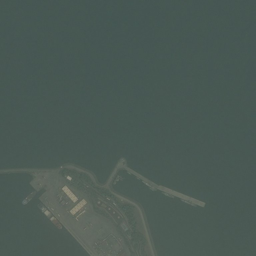

0


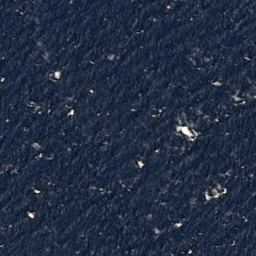

0


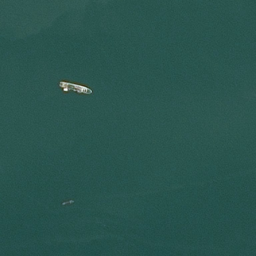

1


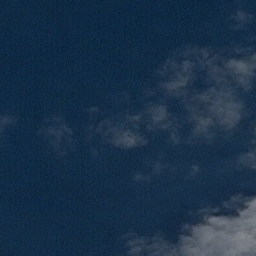

0


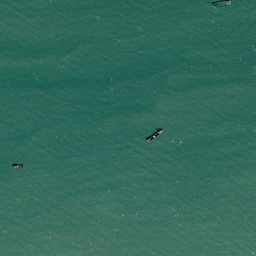

1


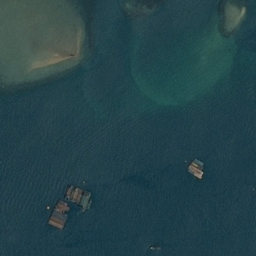

0


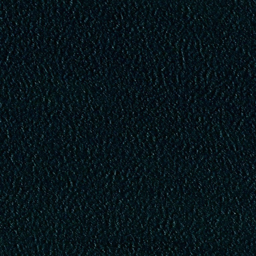

0


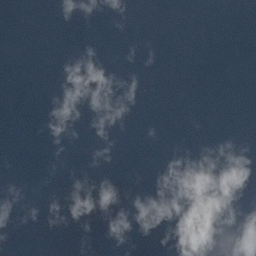

0


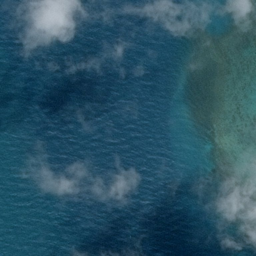

0


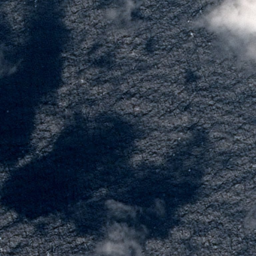

0


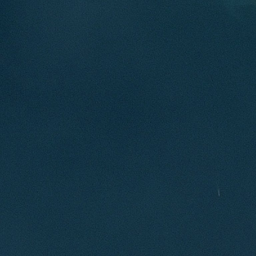

0


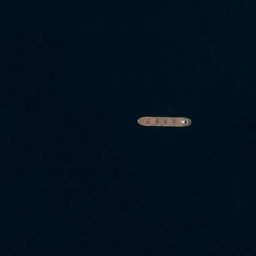

1


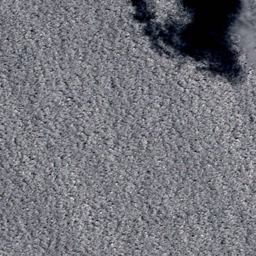

0


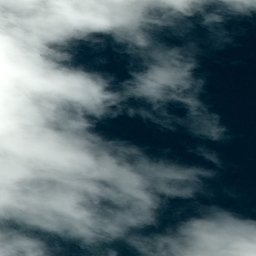

0


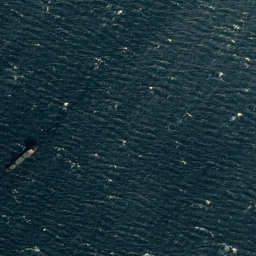

0


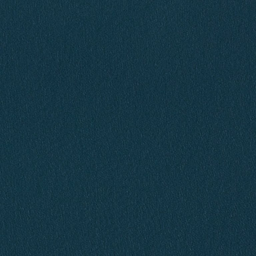

0


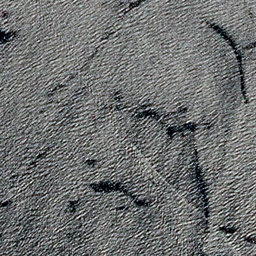

0


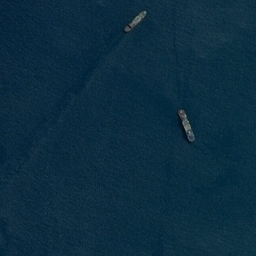

1


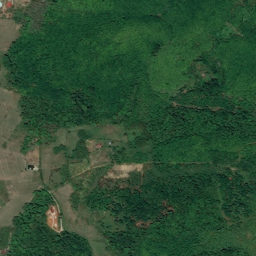

0


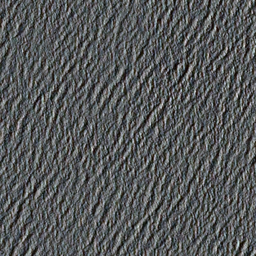

0


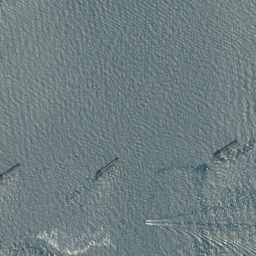

1


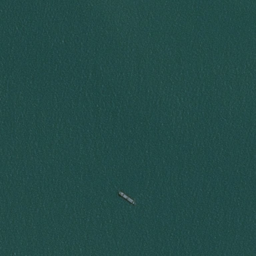

1


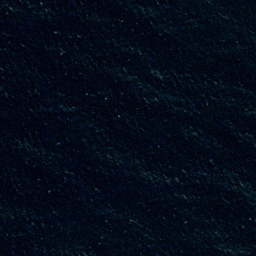

0


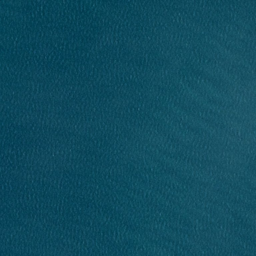

0


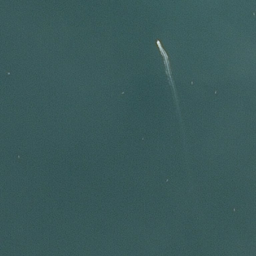

1


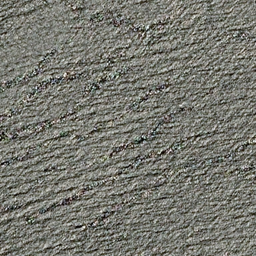

0


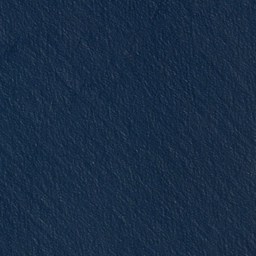

0


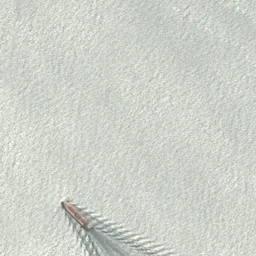

1


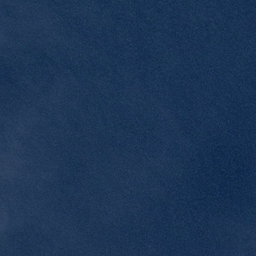

0


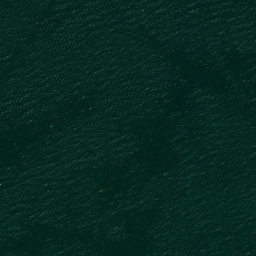

0


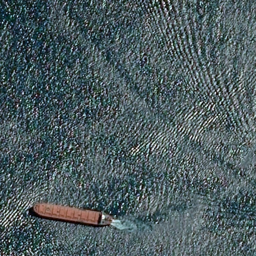

1


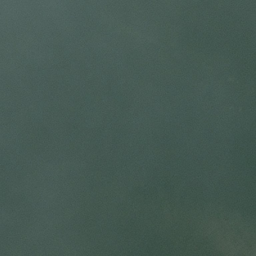

0


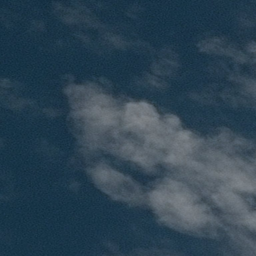

0


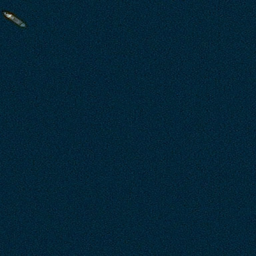

0


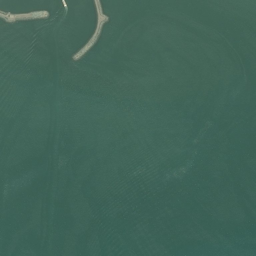

0


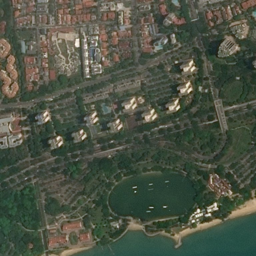

0


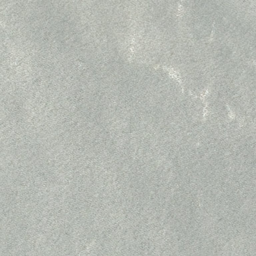

0


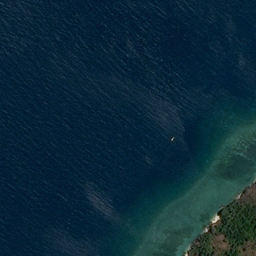

0


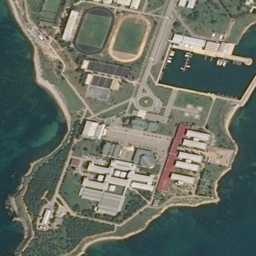

0


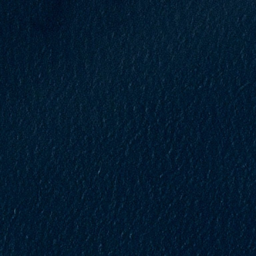

0


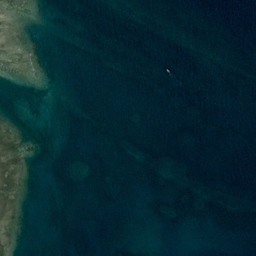

0


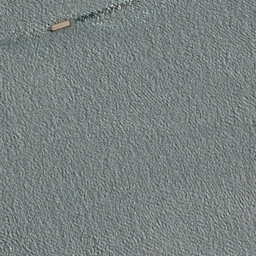

1


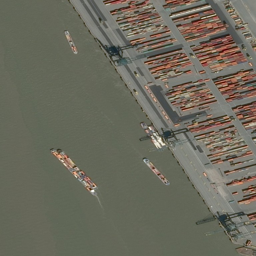

1


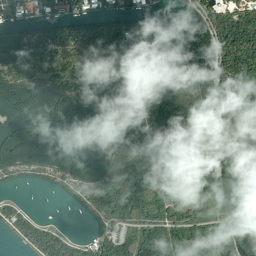

0


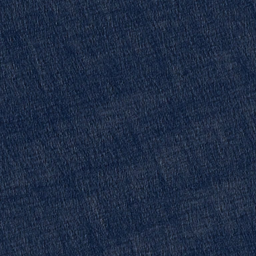

0


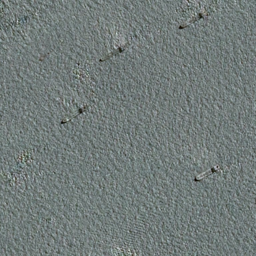

1


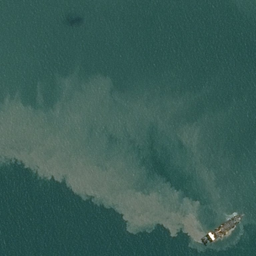

0


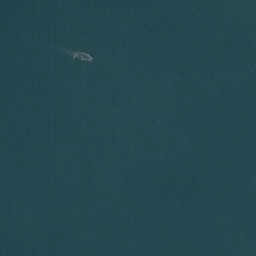

1


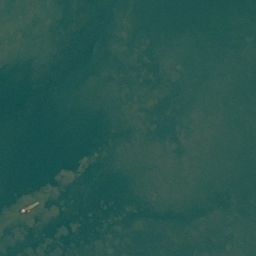

1


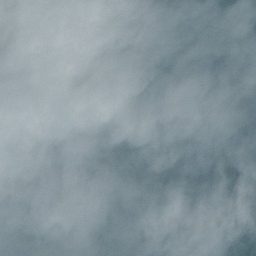

0


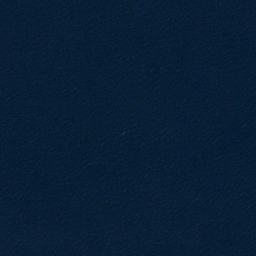

0


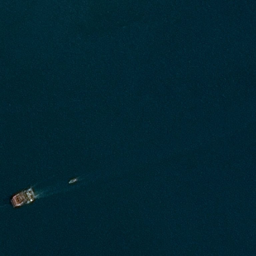

1


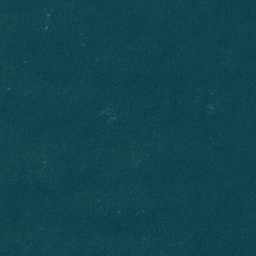

0


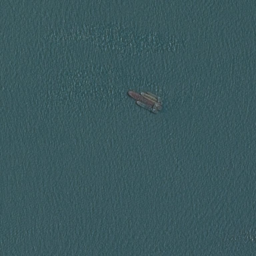

1


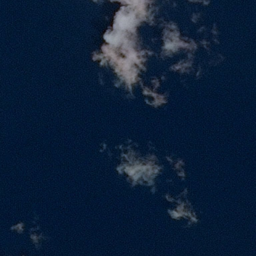

0


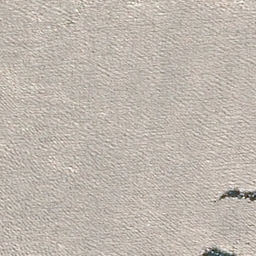

0


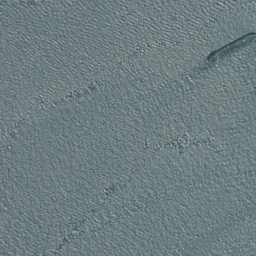

1


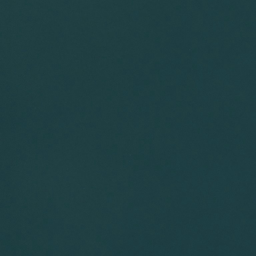

0


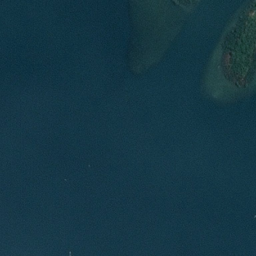

0


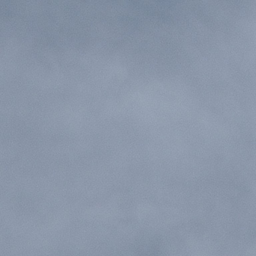

0


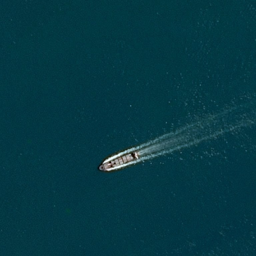

1


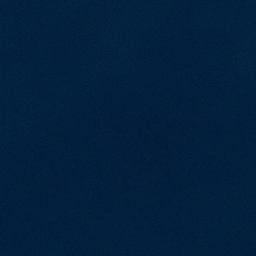

0


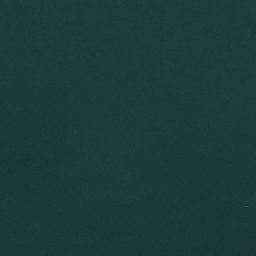

0


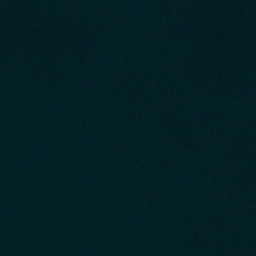

0


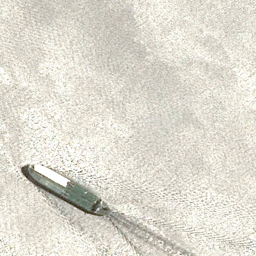

1


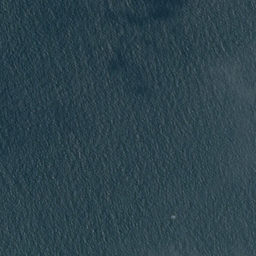

0


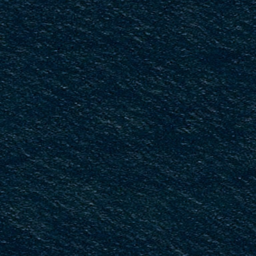

0


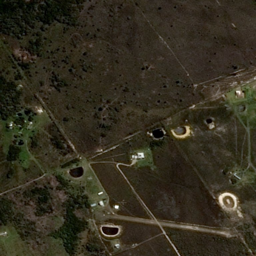

0


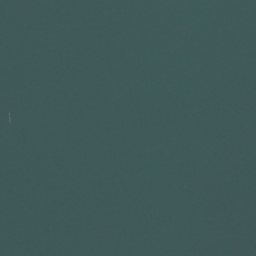

0


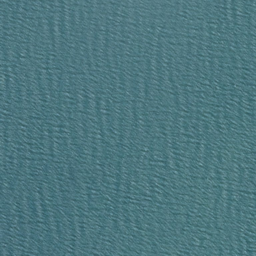

0


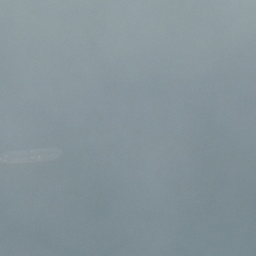

0


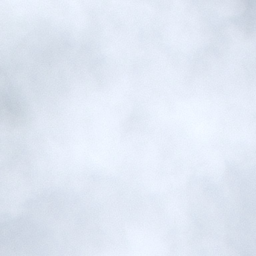

0


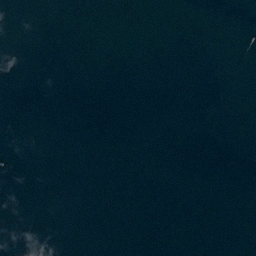

0


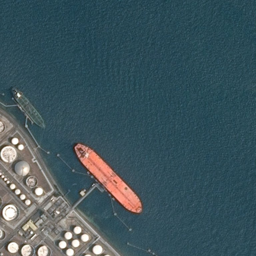

1


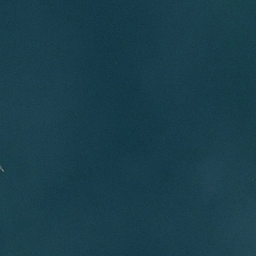

0


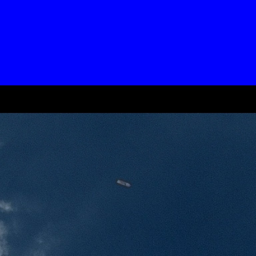

1


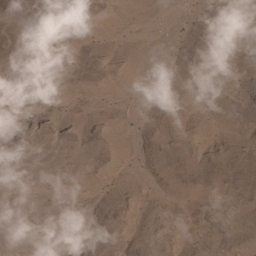

0


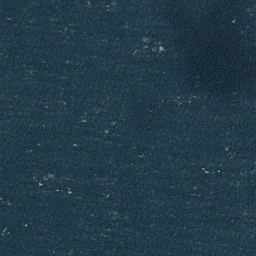

0


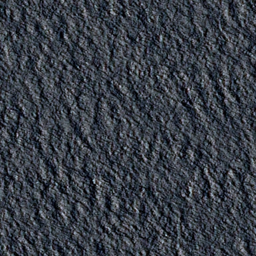

0


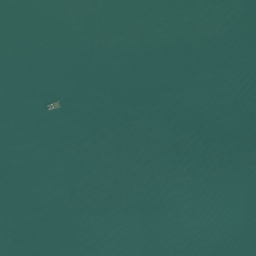

0


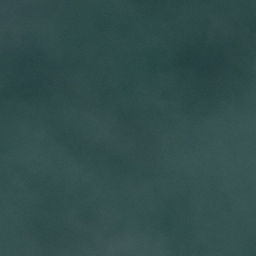

0


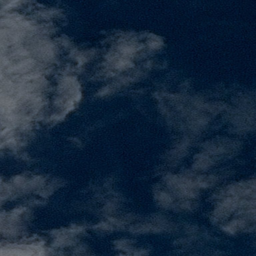

0


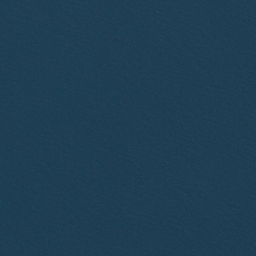

0


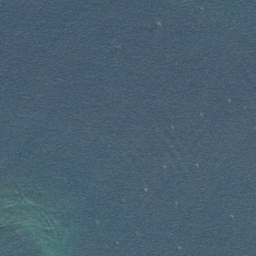

0


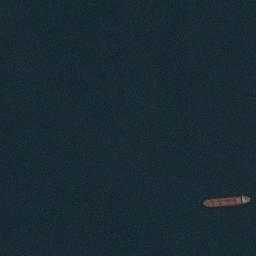

1


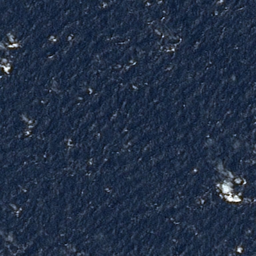

0


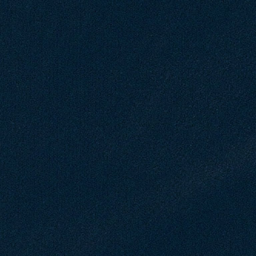

0


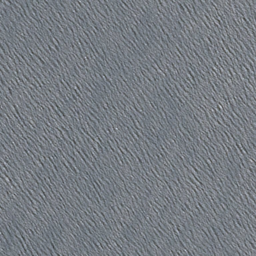

0


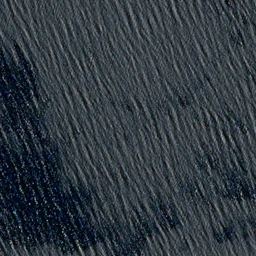

0


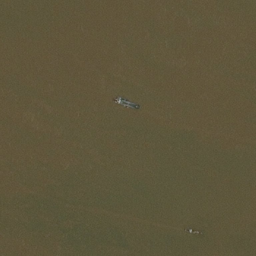

1


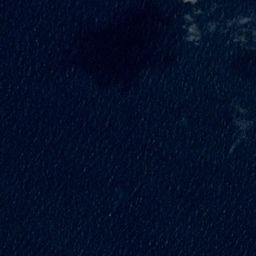

0


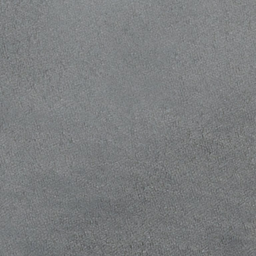

0


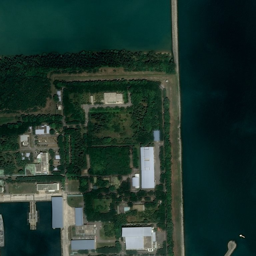

0


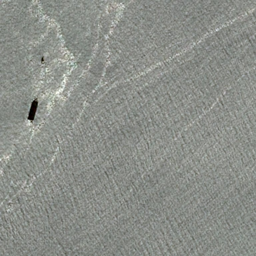

1


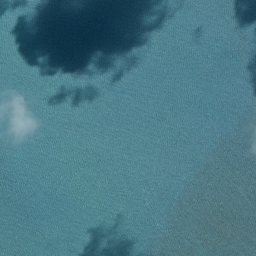

0


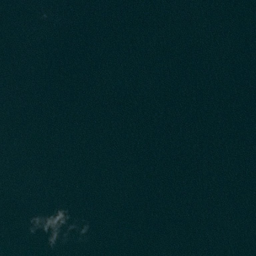

0


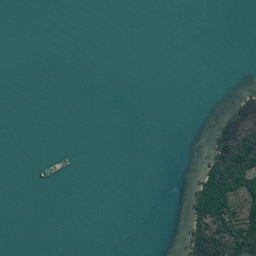

1


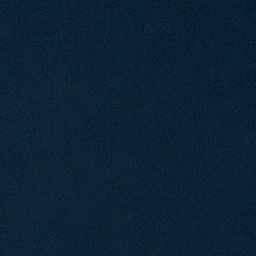

0


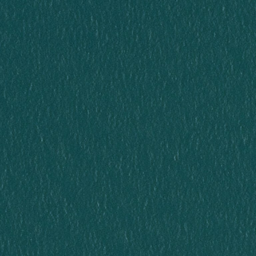

0


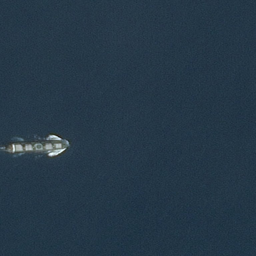

1
CPU times: user 5.98 s, sys: 206 ms, total: 6.19 s
Wall time: 2min 52s


In [ ]:
%%time
index = 0
n = 100
Y = np.array([[0] * 2] * n)
Y_true = np.array([[0] * 2] * n)
l = data['ImageId'].values
anss = data['exist_ship'].values
offset = 500
for i in range(n): 
    image_name = l[offset + i]
    imageA = Image.open(Train_path+image_name).resize((256, 256)) #open and resize image
    display(imageA)
    ans = int(input())
    Y[i][ans] = 1
    Y_true[i][anss[offset + i]] = 1

In [ ]:
np.save('/content/drive/MyDrive/Диплом/Ship_detection/Input/human_ans', Y)

In [ ]:
from sklearn.metrics import accuracy_score
print("Точность (accuracy) равно ", accuracy_score(Y_true, Y))

Точность (accuracy) равно  0.78


In [ ]:
from sklearn.metrics import precision_score
print("Точность (precision) равно ", 
      precision_score(Y_true.reshape(-1, 1), Y.reshape(-1, 1)))

Точность (precision) равно  0.78


In [ ]:
from sklearn.metrics import recall_score
print("Полнота (recall) равно ",
      recall_score(Y_true.reshape(-1, 1), Y.reshape(-1, 1)))

Полнота (recall) равно  0.78
